In [1]:
import os
import copy
import glob
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

## 1. Data preparation

### 1.1 Download and split

In [3]:
rgb_img_path = glob.glob("flower_colorization/flower_jpg/*.jpg")
len(rgb_img_path)

8189

In [4]:
gray_img_folder = "flower_colorization/gray_img/"
os.makedirs(gray_img_folder, exist_ok=True)

for img_path in rgb_img_path:
    img = Image.open(img_path).convert('L')
    path_save = gray_img_folder + img_path.split("/")[-1]
    img.save(path_save)

In [5]:
gray_img_path = glob.glob("flower_colorization/gray_img/*.jpg")
len(gray_img_path)

8189

In [6]:
def get_sampler(image_paths, labels_path):
    ratio_split = 0.2
    num_sample = len(image_paths)
    indices = list(range(num_sample))
    split = int(np.floor(ratio_split * num_sample))
    np.random.shuffle(indices)
    train_idx, valid_idx = indices[split:], indices[:split]
    train_sampler = [(image_paths[i], labels_path[i]) for i in train_idx]
    valid_sampler = [(image_paths[i], labels_path[i]) for i in valid_idx]

    return train_sampler, valid_sampler

def copy2dir(source_paths, dst_dir):
    os.makedirs(dst_dir+'images/', exist_ok=True)
    os.makedirs(dst_dir+'labels/', exist_ok=True)
    for img, label in source_paths:
        cmd_img = f"cp {img} {dst_dir+'images/'}"
        cmd_label = f"cp {label} {dst_dir+'labels/'}"
        os.system(cmd_img)
        os.system(cmd_label)

In [7]:
train_sampler, valid_sampler = get_sampler(gray_img_path, rgb_img_path)

In [8]:
copy2dir(train_sampler, 'flower_colorization/train/')
copy2dir(valid_sampler, 'flower_colorization/val/')

In [9]:
def check(data_dir):
    image_path = glob.glob(data_dir+'/images/*.jpg')
    label_path = glob.glob(data_dir+'/labels/*.jpg')

    image_name = [i.split('/')[-1] for i in image_path]
    label_name = [i.split('/')[-1] for i in label_path]

    error = False
    for i in image_name:
        if i not in label_name:
            error = True
            print(i)
    
    for j in label_name:
        if j not in image_name:
            error = True
            print(j)

    return not error

train_checker = check("flower_colorization/train")
val_checker = check("flower_colorization/val")

train_checker, val_checker


(True, True)

### 1.2 Dataloader

In [10]:
from torch.utils.data import Dataset

class Flower_Colorization(Dataset):
    def __init__(self, dir_root, transform=None, target_transform=None):
        super().__init__()
        self.dir_root = dir_root
        self.transform = transform
        self.target_transform = target_transform
        self.image_paths = glob.glob(dir_root+"images/*.jpg")
        self.label_paths = glob.glob(dir_root+"labels/*.jpg")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image = Image.open(self.image_paths[index])
        label = Image.open(self.label_paths[index])
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return (image, label)

In [12]:
from torchvision import transforms
import tqdm as notebook_tqdm

img_size = (224, 224)

transform = transforms.Compose([
              transforms.Resize(img_size),
              transforms.ToTensor()
])

target_transform = transforms.Compose([
                    transforms.Resize(img_size),
                    transforms.ToTensor()
])

train_set = Flower_Colorization("flower_colorization/train/",
                                transform=transform,
                                target_transform=target_transform)

val_set = Flower_Colorization("flower_colorization/val/",
                              transform=transform,
                              target_transform=target_transform)

In [13]:
from torch.utils.data import DataLoader

batch_size = 64

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=6)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=6)

## 2. Model

In [15]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        x = self.conv_block(x)
        return x

# Down-Sample
class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlock(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


# Up-Sample
class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_trans = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x1, x2):
        x1  = self.conv_trans(x1)
        x = torch.cat([x2, x1], dim=1)
        x = self.conv_block(x)
        return x


class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super().__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.in_conv = ConvBlock(n_channels, 64)

        self.enc_1 = Encoder(64, 128)
        self.enc_2 = Encoder(128, 256)
        self.enc_3 = Encoder(256, 512)
        self.enc_4 = Encoder(512, 1024)

        self.dec_1 = Decoder(1024, 512)
        self.dec_2 = Decoder(512, 256)
        self.dec_3 = Decoder(256, 128)
        self.dec_4 = Decoder(128, 64)

        self.out_conv = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.in_conv(x)

        x2 = self.enc_1(x1)
        x3 = self.enc_2(x2)
        x4 = self.enc_3(x3)
        x5 = self.enc_4(x4)

        x = self.dec_1(x5, x4)
        x = self.dec_2(x, x3)
        x = self.dec_3(x, x2)
        x = self.dec_4(x, x1)

        x = self.out_conv(x)
        x = nn.Sigmoid()(x)

        return x

In [16]:
from torchsummary import summary

model = UNet(n_channels=1, n_classes=3).to(device)
summary(model, (1, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]             576
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,864
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
         ConvBlock-7         [-1, 64, 224, 224]               0
         MaxPool2d-8         [-1, 64, 112, 112]               0
            Conv2d-9        [-1, 128, 112, 112]          73,728
      BatchNorm2d-10        [-1, 128, 112, 112]             256
             ReLU-11        [-1, 128, 112, 112]               0
           Conv2d-12        [-1, 128, 112, 112]         147,456
      BatchNorm2d-13        [-1, 128, 112, 112]             256
             ReLU-14        [-1, 128, 1

## 3. Train

In [21]:
def de_normalize(image, to_int8=True):
    if image.get_device() != -1:
        image = image.cpu()
    image = image.numpy().transpose(1,2,0)
    if to_int8:
        return (image*255).astype(np.uint8)
    return image


@torch.inference_mode()
def display_prediction(model, image, target):
    model.eval()
    img = image[None,...].to(device)
    output = model(img)[0, ...]

    plt.figure(figsize=(10, 5))
    
    input_img = de_normalize(image)
    plt.subplot(1,3,1)
    plt.axis('off')
    plt.title("Input Image")
    plt.imshow(input_img, cmap='gray')

    plt.subplot(1,3,2)
    plt.axis('off')
    plt.title("Prediction")
    pred = de_normalize(output)
    plt.imshow(pred)

    plt.subplot(1,3,3)
    plt.axis('off')
    plt.title("Ground Truth")
    target_img = de_normalize(target)
    plt.imshow(target_img)

    plt.show()

In [22]:
def evaluate(model, test_loader, criterion):
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            test_loss += loss.item()

    test_loss = test_loss / len(test_loader)
    return test_loss

In [23]:
max_epoch = 10
LR = 0.001
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

Epoch [1/10], Trainning loss: 0.0161, Test Loss: 0.0151
Test image_33 after epoch 1: 


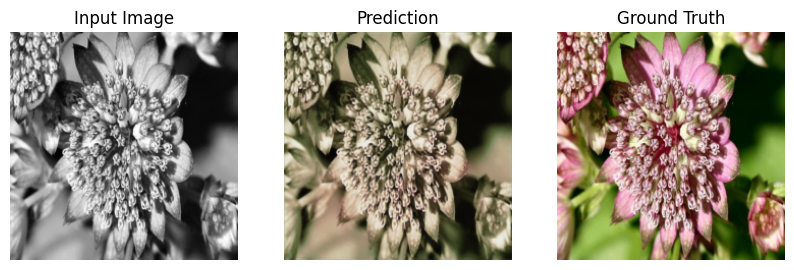

Epoch [2/10], Trainning loss: 0.0153, Test Loss: 0.0163
Test image_33 after epoch 2: 


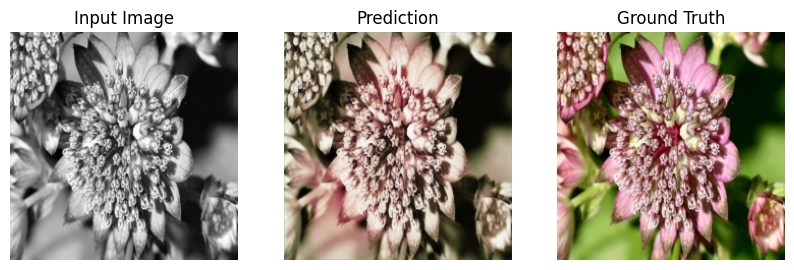

Epoch [3/10], Trainning loss: 0.0150, Test Loss: 0.0143
Test image_33 after epoch 3: 


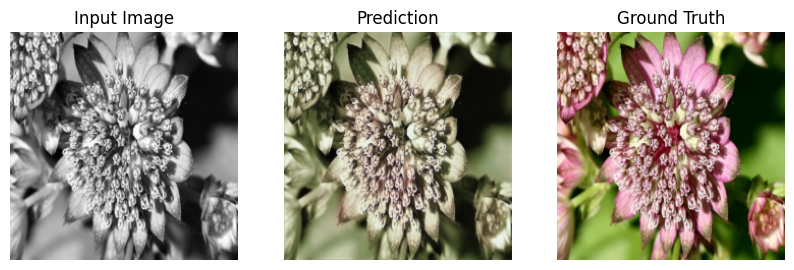

Epoch [4/10], Trainning loss: 0.0147, Test Loss: 0.0143
Test image_33 after epoch 4: 


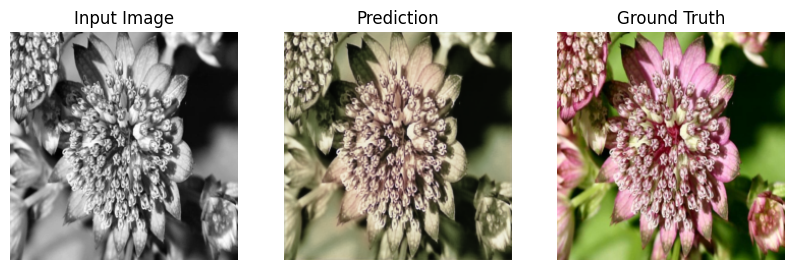

Epoch [5/10], Trainning loss: 0.0145, Test Loss: 0.0138
Test image_33 after epoch 5: 


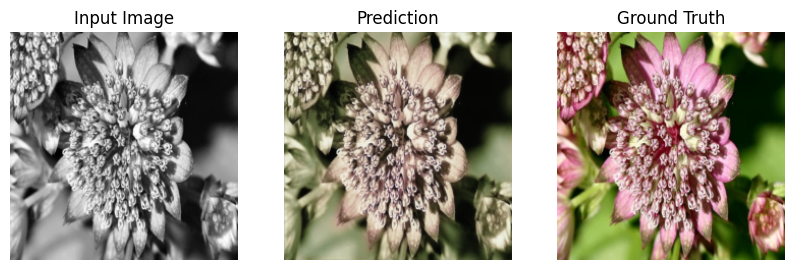

Epoch [6/10], Trainning loss: 0.0143, Test Loss: 0.0139
Test image_33 after epoch 6: 


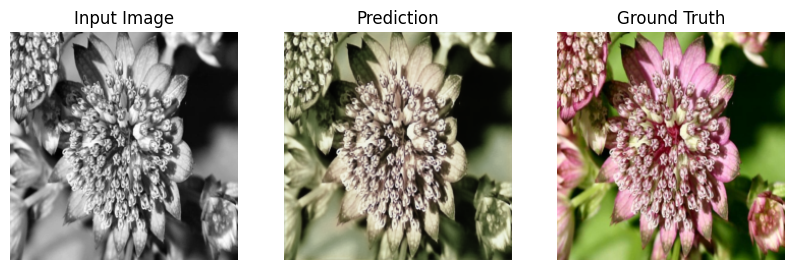

Epoch [7/10], Trainning loss: 0.0143, Test Loss: 0.0137
Test image_33 after epoch 7: 


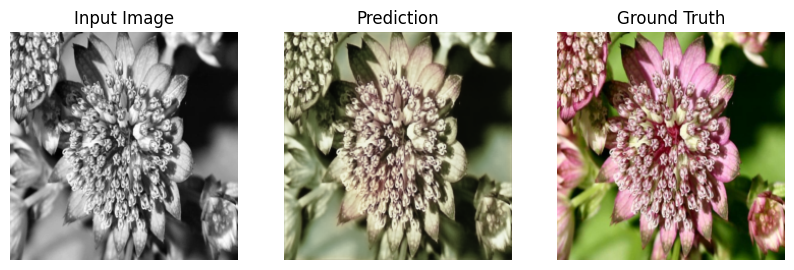

Epoch [8/10], Trainning loss: 0.0141, Test Loss: 0.0171
Test image_33 after epoch 8: 


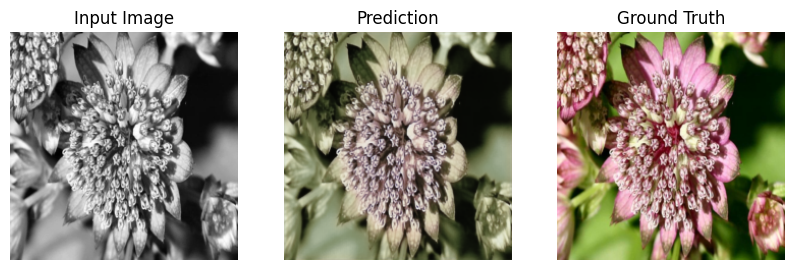

Epoch [9/10], Trainning loss: 0.0138, Test Loss: 0.0153
Test image_33 after epoch 9: 


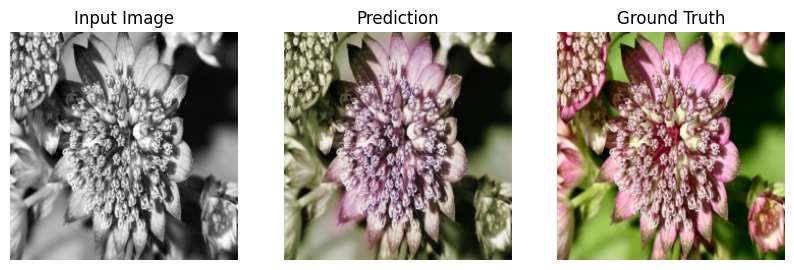

Epoch [10/10], Trainning loss: 0.0137, Test Loss: 0.0150
Test image_33 after epoch 10: 


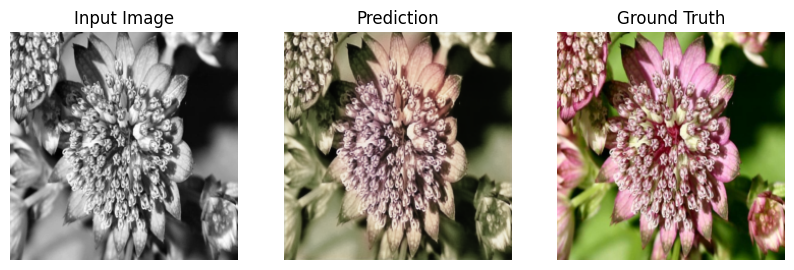

In [24]:
test_index = 33
display_image = val_set[test_index][0]
display_target = val_set[test_index][1]


train_losses = []
test_losses = []
best_loss = float('inf')
best_model_wts = copy.deepcopy(model.state_dict())

model.to(device)
for epoch in range(max_epoch):
    model.train()
    running_loss = 0.0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        running_loss += loss.item()
        loss.backward()
        optimizer.step()
    epoch_loss = running_loss / len(train_loader)
    test_loss = evaluate(model, val_loader, criterion)
    if test_loss < best_loss:
        best_loss = test_loss
        best_model_wts = copy.deepcopy(model.state_dict())
    print(f"Epoch [{epoch + 1}/{max_epoch}], Trainning loss: {epoch_loss:.4f}, Test Loss: {test_loss:.4f}")
    print(f"Test image_{test_index} after epoch {epoch+1}: ")
    display_prediction(model, display_image, display_target)


train_losses.append(epoch_loss)
test_losses.append(test_loss)

In [25]:
model.load_state_dict(best_model_wts)

<All keys matched successfully>

## 4. Prediction

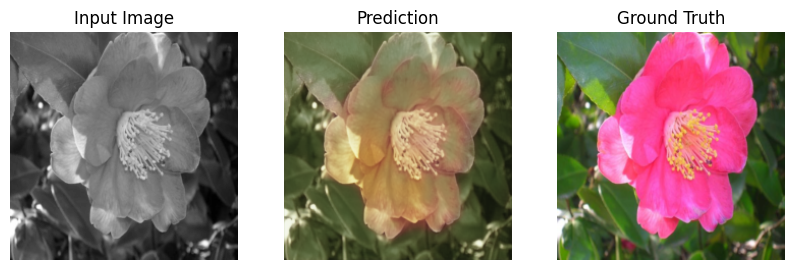

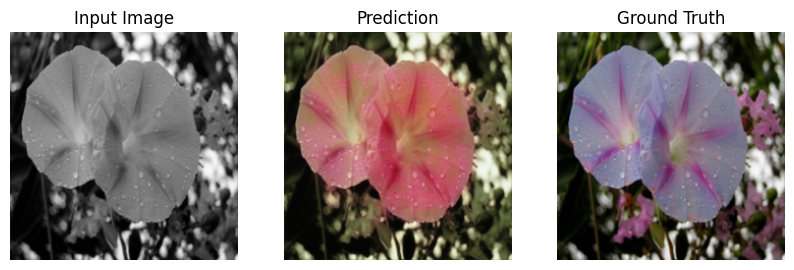

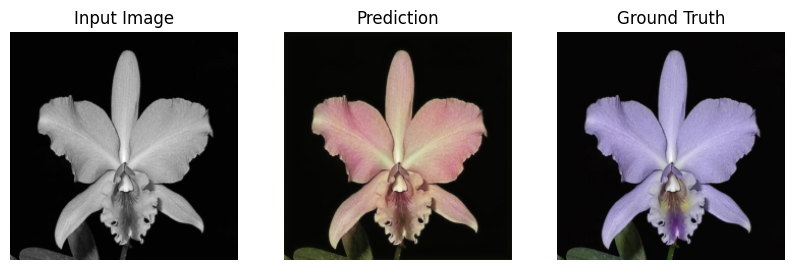

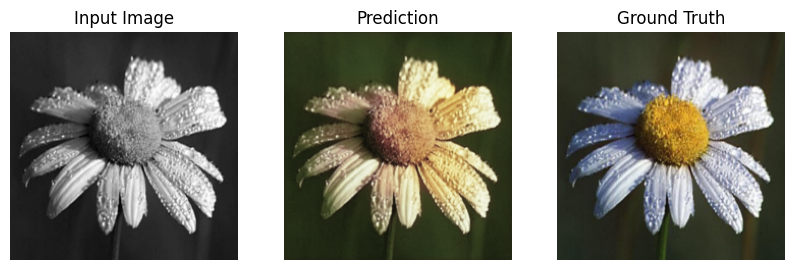

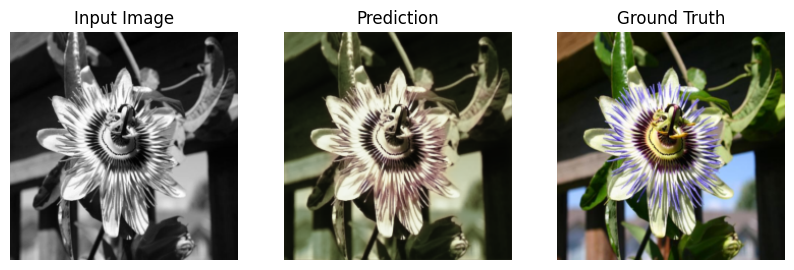

...

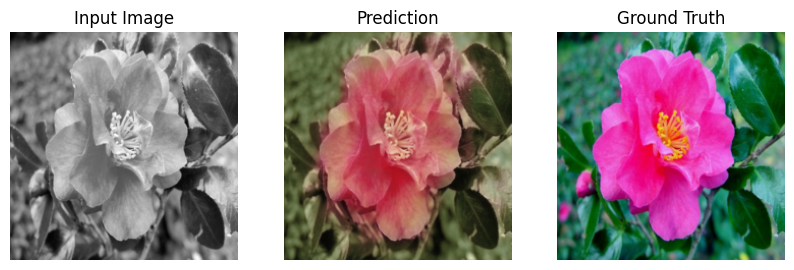

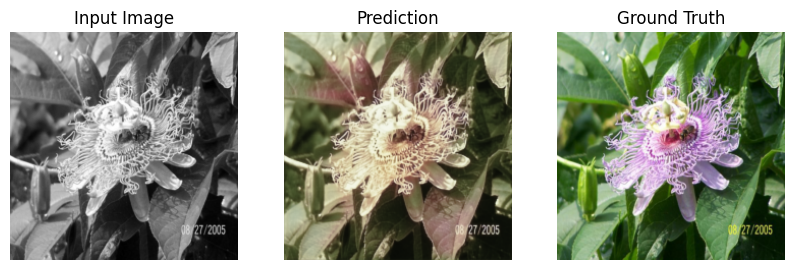

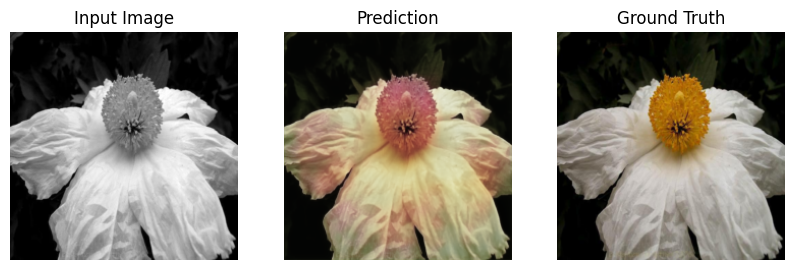

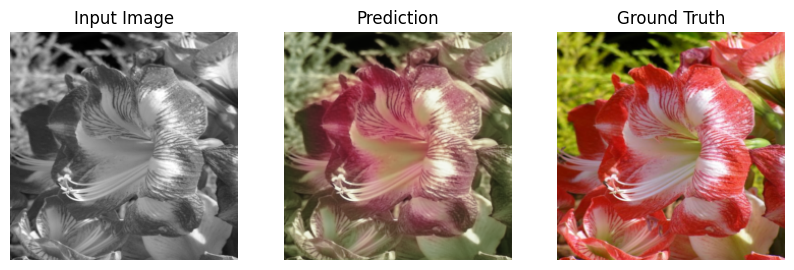

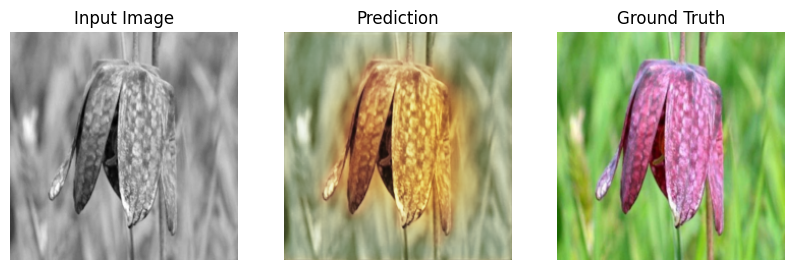

In [26]:
n_test_points = 20

for i in np.random.randint(0, len(val_set), size=(n_test_points,)):
    image, target = val_set[i]
    display_prediction(model, image, target)